### PROJECT INTRODUCTION

The project start by installing the Roversim Simulator ,that is a Unity game, or robot that move under our commands from the keyboard. It rotates , move in all directions . It is a simulator for an actual robot 
It has two cameras as well an an arm to collect rocks in his virtual world

We can optionally Record all its movements , by hit R .

This will generate a folder called IMG. Inside this folder the "robot" will store a lot of images in the format
    /IMG/robocam_2018_12_12_11_44_55_000.jpg
Also we will have a .csv file that will store a relation between the images names and the the robot parameters
SteerAngle	Throttle	Brake	Speed	X_Position	Y_Position	Pitch	Yaw	Roll

Note: Be careful with hitting R twice as the infromation will added to the csv file , along with a row for the headers: Path,SteerAngle;Throttle;Brake;Speed;X_Position;Y_Position;Pitch;Yaw;Roll,

So basically the csv file will conatins multiple rows ,where each row is a collection of the 
On image path
and the following features of teh robots at the moment the picture was taken:
SteerAngle;Throttle;Brake;Speed;X_Position;Y_Position;Pitch;Yaw;Roll,

Example

Path	SteerAngle	Throttle	Brake	Speed	X_Position	Y_Position	Pitch	Yaw	Roll
/Users/david/Documents/Udacity NanoDegrees /RoboticSoftwareEngineerUdacity/IMG/robocam_2018_12_12_11_32_36_914.jpg
Path	SteerAngle	Throttle	Brake	Speed	X_Position	Y_Position	Pitch	Yaw	Roll
0	0	1	0	99.97939	85.54031	0.0002373147	358.2829	-2.02865E-06

/Users/david/Documents/Udacity NanoDegrees /RoboticSoftwareEngineerUdacity/IMG/robocam_2018_12_12_11_32_36_918.jpg	
Path	SteerAngle	Throttle	Brake	Speed	X_Position	Y_Position	Pitch	Yaw	Roll
0	0	0	0	99.97939	85.54031	0.0002373147	358.2829	-2.02865E-06

Images will be recorded inside a file called IMG/. The csv file will be in the same directory of  IMG/

## Introduction to using numpy and matplotlib with Images

Numpy will allow us to see the images as a numerical array. Depending on the image data type we can see the image as differents arrays.

We can see the image data types as : ( from here [http://scikit-image.org/docs/dev/user_guide/data_types.html#data-types] )

Data type	Range
uint8	    0 to 255
uint16	    0 to 65535
uint32	    0 to 2exp32 - 1


We will need to instal openCV 

OpenCV (Open source computer vision) is a library of programming functions mainly aimed at real-time computer vision.[1] Originally developed by Intel,[2] it was later supported by Willow Garage then Itseez (which was later acquired by Intel[3]). The library is cross-platform and free for use under the open-source BSD license.

OpenCV supports the deep learning frameworks TensorFlow, Torch/PyTorch and Caffe.[4]

## Installing needed packages with anaconda 

### CREATION OF A VIRTUAL ENVIOROMENT

We created a VENV called numpyImagesCONDA_ENV to practice teh code given in class


In [ ]:
# Creation of conda venv
#conda create --name numpyImagesCONDA_ENV jupyter numpy opencv matplotlib pillow flask  pillow scipy pandas /
#                                  / requests glob2 requests
#from conda-forge we will need the following pacakges  
#conda install -c conda-forge moviepy
#conda install -c conda-forge eventlet
#Installation of python-socketio 
#pip install python-sockeio

# Listing all VENV
# $ conda env list

# # conda environments:
# base                  *  /anaconda3
# RoboND-Rover-ENV         /anaconda3/envs/RoboND-Rover-ENV
# ds_ml_env                /anaconda3/envs/ds_ml_env
# my_app2                  /anaconda3/envs/my_app2
# numpyImagesCONDA_ENV     /anaconda3/envs/numpyImagesCONDA_ENV
# untitled                 /anaconda3/envs/untitled

# # Activating the conda venv
# david Roversim-Introduction
# $ conda activate numpyImagesCONDA_ENV
# (numpyImagesCONDA_ENV) david Roversim-Introduction

# # Where we are 
# $ pwd
# /Users/david/Documents/Udacity NanoDegrees /Robotic Software Eng/RoverSimIntroduction/Roversim-Introduction
# (numpyImagesCONDA_ENV) david Roversim-Introduction

# # Starting jupyter notebook
# (numpyImagesCONDA_ENV) david Roversim-Introduction
# $ jupyter notebook

# Now we should be ready to start

In [296]:
%matplotlib inline
# Needed to print in Jupyter
#%matplotlib qt # Choose %matplotlib qt to plot to an interactive window (note it may show up behind your browser)
# Make some of the relevant imports
import cv2
import numpy as np
from scipy.misc import imsave # To save images. Recomeded to use imageio
import imageio  # recomended to save images
import glob  # For reading in a list of images from a folder

In [297]:
pwd


'/Users/david/Documents/Udacity NanoDegrees /Robotic Software Eng/RoverSimIntroduction/Roversim-Introduction'

In [298]:
ls -al

total 11744
drwxr-xr-x  15 david  staff      480 Dec 18 15:41 ./
drwxr-xr-x   5 david  staff      160 Dec 18 15:41 ../
-rw-r--r--@  1 david  staff     8196 Dec 16 13:59 .DS_Store
drwxr-xr-x   3 david  staff       96 Dec 18 15:34 .ipynb_checkpoints/
-rw-r--r--@  1 david  staff    97469 Dec 11 16:47 Robots Movement Descriptions.gif
-rw-r--r--   1 david  staff  3768243 Dec 18 15:41 Using Numpy with Images.ipynb
drwxr-xr-x  13 david  staff      416 Dec 16 13:03 calibration_images/
-rw-r--r--   1 david  staff     7163 Dec 18 15:36 original_1.jpg
-rw-r--r--   1 david  staff      947 Dec 18 15:36 outfile_colorsel.jpg
-rw-r--r--   1 david  staff      947 Dec 15 19:56 outfile_colorselIMAGEIO.jpg
drwxr-xr-x   2 david  staff       64 Dec 16 20:54 output/
-rw-r--r--@  1 david  staff     5853 Dec 11 17:45 robocam_2018_12_11_17_43_34_365.jpg
-rw-r--r--@  1 david  staff     7159 Dec 11 17:45 robocam_2018_12_11_17_44_32_808.jpg
drwxr-xr-x   5 david  staff      160 Dec 16 14:55 test_dataset/
-rw-r--r--

In [178]:
# Be careful it will take all app relative to this folder. If you do it recall to come back to this folder
# cd IMG/

In [5]:
# let see the content of IMG without uisng cd as it will change teh path
#ls -al 

In [6]:
#cd ..

In [299]:
# We took this two imagenes by Recording the Rover movement. Images are created in a IMG folder.
# We renamed and put them here
# This image of a terrain is a 6Kb , 320X160pixels , RGB image(3 layers) , 72 pixel/inches
img1 = 'calibration_images/example_terrainIntroduction.jpg'
# This image of a rock is a 7Kb , 320X160pixels , RGB image , 72 pixel/inches
img2 = 'calibration_images/example_rockIntroduction.jpg'

In [300]:
print(img1)
print(img2)

calibration_images/example_terrainIntroduction.jpg
calibration_images/example_rockIntroduction.jpg


In [301]:

im_g1=cv2.imread(img1)
im_g2=cv2.imread(img2)

In [302]:
# Let see the type
# We can try our image as aumpy array !!
type(im_g1)

numpy.ndarray

In [304]:
# from the cotent we have a three dimensional array  of dtype=uint8
#im_g2

In [184]:
im_g2.shape

(160, 320, 3)

In [185]:
im_g2.min()

0

In [186]:
im_g2.max()

255

In [187]:
im_g2.dtype

dtype('uint8')

We see from the shape of the array that we have a 3 dimensional array of dtype=uint8
With maximun values of 255 and minimun of 0

In [188]:
im_g2[0]

array([[ 13,  17,  22],
       [ 15,  19,  24],
       [ 18,  22,  27],
       [ 21,  25,  30],
       [ 22,  26,  31],
       [ 20,  24,  29],
       [ 18,  22,  27],
       [ 17,  21,  26],
       [ 16,  20,  25],
       [ 13,  17,  22],
       [ 10,  14,  19],
       [  8,  12,  17],
       [ 10,  14,  19],
       [ 15,  19,  24],
       [ 21,  25,  30],
       [ 26,  30,  35],
       [ 31,  42,  62],
       [ 44,  55,  77],
       [ 54,  65,  92],
       [ 57,  68,  98],
       [ 58,  70, 104],
       [ 59,  72, 110],
       [ 56,  68, 110],
       [ 49,  60, 104],
       [ 55,  64, 108],
       [ 56,  62, 107],
       [ 55,  61, 104],
       [ 54,  56,  96],
       [ 47,  49,  84],
       [ 38,  37,  71],
       [ 27,  25,  55],
       [ 19,  17,  46],
       [ 18,  22,  40],
       [ 29,  33,  51],
       [ 32,  35,  50],
       [ 20,  21,  35],
       [  9,   9,  21],
       [ 10,   9,  18],
       [ 13,  11,  17],
       [ 11,  10,  14],
       [  5,   4,   8],
       [  7,   6

In [189]:
im_g2[0].shape

(320, 3)

In [190]:
im_g2[1].shape

(320, 3)

In [191]:
im_g2[159].shape

(320, 3)

So we have 160 arrays each one with a matrix of 320 x 3 values .
We have all teh values between 0-255 (So iy is likely be one the 2exp8 or 256 combination of RGB)
This makes 256*256*256=16777216 possible colors.
We caa go https://www.rapidtables.com/web/color/RGB_Color.html to see the RGB value for each color

So we know also that the image had 160x320 pixels
Then teh meaning of this array is this
We have a matrix ox 160 pixel x 320 pixels defining each point in the 2D plane
Each point is defined by a color .A color is expresed as a combination of RGB 



In [192]:
# Let see the values of the point located in im_g2[159][310]
im_g2[159][310][0]

185

In [193]:
im_g2[159][310][1]

198

In [194]:
im_g2[159][310][2]

220

In [195]:
im_g2[159][310]

array([185, 198, 220], dtype=uint8)

###  CONCLUSION

So, here we can see it's an 8-bit unsigned integer array (uint8), where the size of the array is (160, 320, 3) meaning the image size is 160 pixels in the y-direction (height), 320 pixels in the x-direction (width) and it has 3 layers or "color channels".

We can also see that the minimum and maximum values are 0 and 255, respectively. This comes from the fact that with 8 bits of information for each pixel in each color channel, you have 2^82 
8
  or 256 possible values, with the minimum possible value being 0 and the maximum being 255. Not all images are scaled this way so it's always a good idea to check the range and data type of the array after reading in an image if you're not sure.

The three color channels of the image are red, green and blue or "RGB" for short. The combination of intensity values across the three channels determines what color we see in the image. You can look at each of the color channels in isolation by zeroing out the others and lining them up side by side like this:

In [196]:
# So we see that in the point (159,220) we have a pixel with colors (185,198,220) likely Red=185 Green=198 , Blue=220

# We know that in a RGB matrix:

# 255,255,255 means white 
# 0,0,0, means black

# 255,0,0 Red
# 0,255,0 Green
# 0,0,255 Blue

# Yellow is RED+GREEN  = 255,255,0




Lets try to load the image 

In [305]:
# Import some packages from matplotlib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

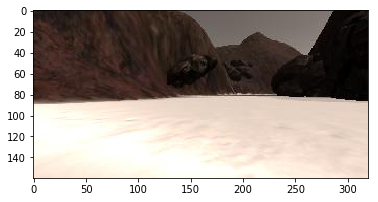

In [306]:
image1 = mpimg.imread(img1)
image2 = mpimg.imread(img2)
plt.imshow(image1)
plt.show()

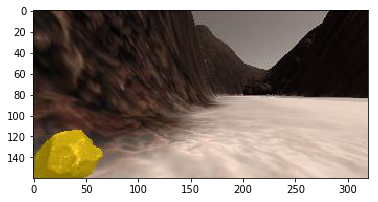

In [307]:
plt.imshow(image2)
plt.show()

#### Creating an image list from the images in IMG/ folder 
#### Loading an displaying a random image

We have  1558 images in test_dataset/IMG/ folder 


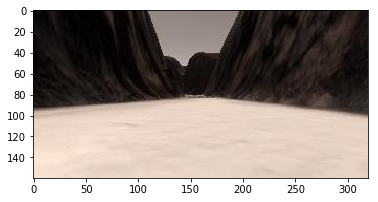

In [310]:
# Loading an displaying a random image
path = 'test_dataset/IMG/*'
img_list = glob.glob(path)
print("We have  {} images in test_dataset/IMG/ folder ".format(len(img_list)))
# Grab a random image and display it
idx = np.random.randint(0, len(img_list)-1)
image = mpimg.imread(img_list[idx])
plt.imshow(image)

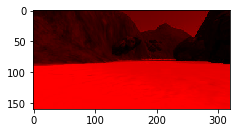

In [311]:
# If we just take image1 we will be modifying the original object
red_channel_IMG1 = np.copy(image1)
# Let now take every point( ) and take all its Green and Blue composition 
#and trun them off, so basically making the picture RED and BLACK
# any of the 160pixelx320pixel change the Greeen and Blue off

red_channel_IMG1[:,:,[1,2]] = 0 
fig = plt.figure(figsize=(12,3)) # Create a figure for plotting
plt.subplot(131) # Initialize subplot number 1 in a figure that is 3 columns 1 row
plt.imshow(red_channel_IMG1) 

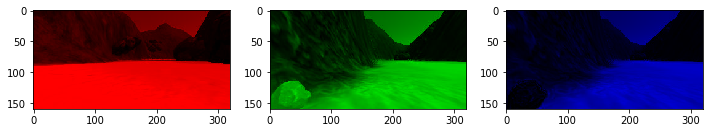

In [312]:
# Now let do the same for the GREEN and BLUE with the second imag
green_channel = np.copy(image2)
green_channel[:,:,[0, 2]] = 0 # Zero out the red and blue channels
blue_channel = np.copy(image2)
blue_channel[:,:,[0, 1]] = 0 # Zero out the red and green channels
fig = plt.figure(figsize=(12,3)) # Create a figure for plotting
plt.subplot(131) # Initialize subplot number 1 in a figure that is 3 columns 1 row
plt.imshow(red_channel_IMG1) # Plot the red channel
plt.subplot(132) # Initialize subplot number 2 in a figure that is 3 columns 1 row
plt.imshow(green_channel)  # Plot the green channel
plt.subplot(133) # Initialize subplot number 3 in a figure that is 3 columns 1 row
plt.imshow(blue_channel)  # Plot the blue channel
plt.show() 

# BINARY IMAGES
Read here about [binary images] (https://en.wikipedia.org/wiki/Binary_image)
 
## np.zeros_likes() function
Numpy np.zeros_like(ARRAY_OBJ) function:
   Creates an array with the same shape of the ARRAY_OBJ
   Allow us to reshape the results by setting axis=0 while creating the zero like array 
   Example we can create an array F withe same shape of X  that was a three dimenstional array , but only with 
   its first two dimensions
   
   EXAMPLE

In [203]:
# EXAMPLE OF WORKING WITH zero_likes
x = np.arange(6)
x = x.reshape((2, 3))
x


array([[0, 1, 2],
       [3, 4, 5]])

In [204]:
# Now lest try thid
arr0=np.zeros_like(x)

In [205]:
arr0

array([[0, 0, 0],
       [0, 0, 0]])

In [206]:
arr0.shape

(2, 3)

In [207]:
# We see that arr0 is a bidimensional array of 2,3
# We can also reshape an array at the same time we create it using zeros_like
# Lets turn our bi-dimensional array of 2x3 and remove the column and leave it with just a  linela array of 2

In [208]:
arr1 =np.zeros_like(x[:,0])

In [209]:
arr1

array([0, 0])

In [210]:
arr1.shape

(2,)

# Images as numpy arrays with  mpimg.imread('img.jpg')

We have the huge advantage of working with an image as a numpy array by doing 

image_name = 'sample.jpg'
image3 = mpimg.imread(img2)

We know that we can compare a numpy array to a value and obtain a True, False boolean array as a result
We can also compare just part of the array 

In [211]:
# As the image is now a numpy array we can do all this to it
x

array([[0, 1, 2],
       [3, 4, 5]])

In [212]:
# We can compare a whole array to a value and get back a boolean array as a result
b=x>2

In [213]:
b

array([[False, False, False],
       [ True,  True,  True]])

In [214]:
# We can also compare a portion of an array to a value 
# I this case we are comparing column 1-->[1,4] to 0 and we get a lineal array of 2 values -->True True) 
c=x[:,1]>0

In [215]:
c

array([ True,  True])

In [216]:
c.shape

(2,)

## Calibration Data
Read in and display example grid and rock sample calibration images.  You'll use the grid for perspective transform and the rock image for creating a new color selection that identifies these samples of interest. 

In the simulator you can toggle on a grid on the ground for calibration
You can also toggle on the rock samples with the 0 (zero) key.  



In [217]:
pwd

'/Users/david/Documents/Udacity NanoDegrees /Robotic Software Eng/RoverSimIntroduction/Roversim-Introduction'

In [218]:
ls

Robots Movement Descriptions.gif     output/
Using Numpy with Images.ipynb        robocam_2018_12_11_17_43_34_365.jpg
calibration_images/                  robocam_2018_12_11_17_44_32_808.jpg
original_1.jpg                       test_dataset/
outfile_colorsel.jpg                 test_mapping.mp4
outfile_colorselIMAGEIO.jpg


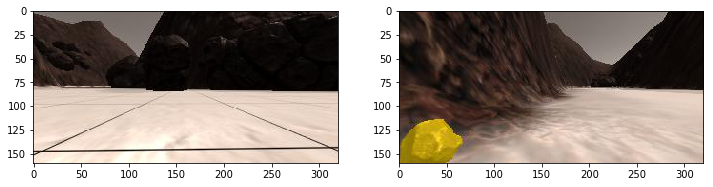

In [313]:
# In the simulator you can toggle on a grid on the ground for calibration
# You can also toggle on the rock samples with the 0 (zero) key.  
# Here's an example of the grid and one of the rocks
example_grid = 'calibration_images/example_grid1.jpg'
example_rock = 'calibration_images/example_rock1.jpg'
grid_img = mpimg.imread(example_grid)
rock_img = mpimg.imread(example_rock)

fig = plt.figure(figsize=(12,3))
plt.subplot(121)
plt.imshow(grid_img)
plt.subplot(122)
plt.imshow(rock_img)

## EXERCISE

EXERCISE:

Write a function that takes as its input a color image and a 3-tuple of color threshold values (integer values from 0 to 255), and outputs a single-channel binary image, which is to say an image with a single color channel where every pixel is set to one or zero. In this case, all pixels that were above the threshold should be assigned a value of 1, and those below a value of 0

Is importnat to note that a Bi-dimensional array will contain in each point ( in this case in each point of a matrix 160x320) ) just one value . If it is a binary array it will contain 0 or 1

However a tridiemnsional array will contain in each point an array of values , not just one value.
In the case of a RGB image , it contains in each point of the 160x320 matrix an array of 3 values, making it a 3 dimensional array 

As we just need one value for a binary image , we do not need a three dimentional array , just a bi-dimenstional one


In [348]:
# Read in the image
# There are six more images available for reading
# called sample1-6.jpg, feel free to experiment with the others!

image3 = mpimg.imread(img2)



The original RGB image, image3 ,  is of type <class 'numpy.ndarray'>
The binary image ,white and black , called colorsel  is of type <class 'numpy.ndarray'>


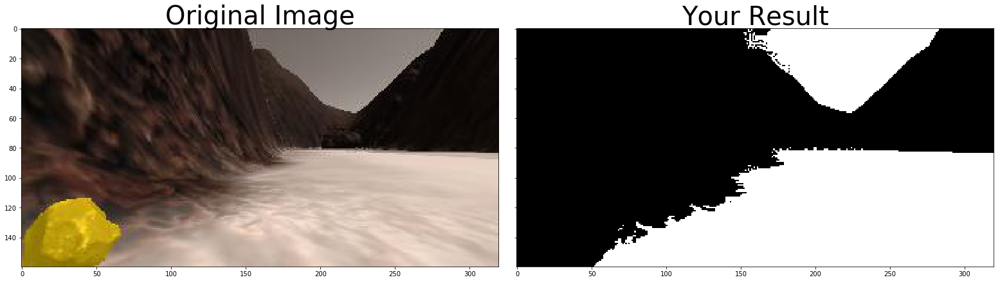

In [349]:

# Define a function to perform a color threshold
# Initialy we passed rgb_thresh=(0, 0, 0) to allow the user to play with some values
# Until he finally realize that 160 is the best threshold
def color_thresh(img, rgb_thresh=(160, 160, 160)):
    ###### TODO:
    # Create an empty array the same size in x and y as the image 
    # but just a single channel
    # print("This is the image shape {}".format(img.shape))
    # Lets create a bidemensional array from the 3 dimensional image 
    # as we are storing 0s and 1s only( intead of an array of 3 values RGB)
    color_select = np.zeros_like(img[:,:,0])
    # print("This is teh color zeros bidimensional array created from imag")
    # print(color_select.shape) # This is a bidimensional array as it will store just 0 and 1
    # print(color_select)
    
    # Apply the thresholds for RGB and assign 1's 
    # where threshold was exceeded
    # Return the single-channel binary image
    
    # Require that each pixel be above all three threshold values in RGB
    # above_thresh will now contain a boolean array with "True"
    # where threshold was met
    above_thresh = (img[:,:,0] > rgb_thresh[0]) \
                & (img[:,:,1] > rgb_thresh[1]) \
                & (img[:,:,2] > rgb_thresh[2])
    # Index the array of zeros with the boolean array and set to 1            
    color_select[above_thresh] = 1
    # Return the binary image
    # Let see how is color select before return it
    #     print("This is color_select features just before returned")
    #     print("A 160x320 bi-dimensional array of 0 and 1, meaning a 160x320 binary array ")
    #     print(color_select.shape)
    #     print(color_select)
    #     print("This is the value of color_select in color_select[10][10] {}".format(color_select[10][10]))
    return(color_select)

    
# Define color selection criteria
###### TODO: MODIFY THESE VARIABLES TO MAKE YOUR COLOR SELECTION
red_threshold = 100
green_threshold = 100
blue_threshold = 100
######
rgb_threshold = (red_threshold, green_threshold, blue_threshold)

# pixels below the thresholds
colorsel = color_thresh(image3, rgb_thresh=rgb_threshold)

# Display the original image and binary               
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(21, 7), sharey=True)
f.tight_layout()
ax1.imshow(image3)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(colorsel, cmap='gray')
ax2.set_title('Your Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
#plt.show() # Uncomment if running on your local machine
print('\n')
print("The original RGB image, image3 ,  is of type {}".format(type(image3)) )
print("The binary image ,white and black , called colorsel  is of type {}".format(type(colorsel)) )
# Lest save them with imsave ..However this is depreacted bettet to use imageio.imwrire
#imsave('outfile_colorsel.jpg', colorsel)
# Saving with reomended imageio
imageio.imwrite('original_1.jpg', image3)
imageio.imwrite('outfile_colorsel.jpg', colorsel)
# Saving using tempfile
#from tempfile import TemporaryFile
# outfile_image33 = TemporaryFile()
# #outfile_colorsel = TemporaryFile()
# np.save(outfile_image33, image3)
# #np.save(outfile_colorsel, colorsel)


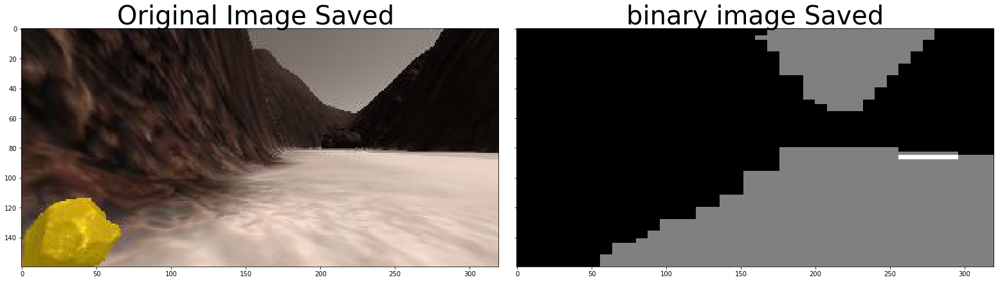

In [350]:
# Check if the saved images are Ok
output2 = mpimg.imread('original_1.jpg')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(21, 7), sharey=True)
f.tight_layout()
ax1.imshow(output2)
ax1.set_title('Original Image Saved ', fontsize=40)

# 
output1 = mpimg.imread('outfile_colorsel.jpg')
ax2.imshow(output1, cmap='gray')
ax2.set_title('binary image Saved', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# DOUBT why it ends this way ? Why it is not similar ?


### OBSTACLE DETECTION
Ok at this point anything white is walking terrains
So how to detect obstacles ? We just need teh coordinates of points that are black ?? 
For obstacles you can just invert your color selection that you used to detect ground pixels, i.e., 
if you've decided that everything above the threshold is navigable terrain, then everthing below 
the threshold must be an obstacle!

### GOLD ROCK DETECTION
For rocks, think about imposing a lower and upper boundary in your color selection to be more specific about 
choosing colors. You can investigate the colors of the rocks (the RGB pixel values) in an interactive 
matplotlib window to get a feel for the appropriate threshold range (keep in mind you may want different ranges 
for each of R, G and B!). Feel free to get creative and even bring in functions from other libraries. 

#### COLOR SELECTION WITH OPENCV
Here's an example of color selection using OpenCV. 
[https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_colorspaces/py_colorspaces.html]

Beware However: if you start manipulating images with OpenCV, keep in mind that it defaults to BGR instead of RGB color space when reading/writing images, so things can get confusing.


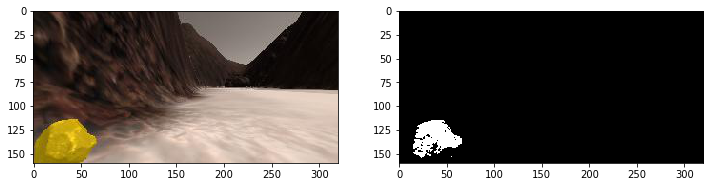

In [351]:
# Creating a function to identify golden rocks
# we need to select the colors for yellow from https://www.rapidtables.com/web/color/RGB_Color.html or similar
# Note that if we try 200, 200, 20 the spot is tiny. Try with 150,150, 20 and the image will be bigger
def find_rocks(img, levels = (150, 150, 50)):
    # compare each element of the thrid axis (0,1,2) withe the leve and return a boolean value(ture or False)
    # whenever teh comparation holds True.rockpixels is a boolean array
    # The threshold for RGB are 
    rockpixels=((img[:, :, 0] > levels[0]) \
               & (img[:, :, 1] > levels[1]) \
               & (img[:, :, 2] < levels[2])
               )
    # Create a numpy array of two dimension (by setting the third axis to 0 we get a bi-dimensional array )
    # Similar to the img array
    color_select = np.zeros_like(img[:, :, 0])
    # Set the true value of the rockpixels to 1 and store them in color_select
    color_select[rockpixels] = 1
    return color_select

rock_img= output2
rock_map = find_rocks(rock_img)
fig = plt.figure(figsize=(12,3))
plt.subplot(121)
plt.imshow(rock_img)
plt.subplot(122)
plt.imshow(rock_map, cmap='gray')
    
    

### PERSPECTIVE TRANSFORMATION
We will create using a transformation a map with a view from the top , marked with squares of 1 square meter.
For that we will use first a Grid image were we can select the 4 corner of a grid in an image captured by the robot.
We will load that image with matplotlib image library and plot it with matplotlib pyplot
We will findout the pixel position of the four corners of the grid, from the image capture in front of the robot camera
This four point will represent how ground like like for teh robot





### Understanding perspective transformation of images


For perspective transformation, you need a 3x3 transformation matrix. 
Straight lines will remain straight even after the transformation. To find this transformation matrix, 
you need 4 points on the input image and corresponding points on the output image. 
Among these 4 points, 3 of them should not be collinear. 

Then transformation matrix can be found by the function
cv2.getPerspectiveTransform. 
Then apply 
cv2.warpPerspective with this 3x3 transformation matrix.

------transformation matrix for an image can be found by applying this two functions
M = cv2.getPerspectiveTransform(source,destination) 
warped = cv2.warpPerspective( image, M, (axis_1,axis_0))

https://docs.opencv.org/3.1.0/da/d6e/tutorial_py_geometric_transformations.html

In [352]:
# We could need to use to see the image with teh x,y positions
# The other notebook represents a png image meanwhile this one represent a vivid image

In [353]:
#%matplotlib notebook
example_grid = "calibration_images/example_grid1.jpg"

In [354]:
image = mpimg.imread(example_grid)

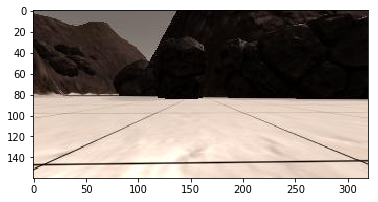

In [355]:
plt.imshow(image)

In [384]:
%matplotlib inline

def perspect_transform(img, src, dst):

    # Get transform matrix using cv2.getPerspectivTransform()
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp image using cv2.warpPerspective()
    # keep same size as input image
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))
    # Run ths same transformation on an array of 1s same size of the images and just one color channel
    mask = cv2.warpPerspective(np.ones_like(img[:, :, 0]), M, (img.shape[1], (img.shape[0])))
    # Return the result
    return warped, mask



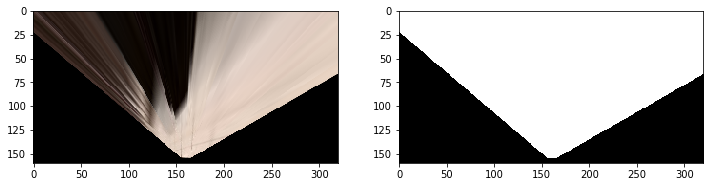

In [357]:
dst_size = 5
bottom_offset = 6

# Enter the points to the np.float32 as ( bottom-left,bottom-right, up-right, up-left)
# SO it is starting in the bootom-left and moving counter clock-wise
source = np.float32([[7.78,147.48], [311.731,144.615], [199.90,99.692] , [117.705,96.692] ])
#source = np.float32([ [7,147], [311,144], [199,99], [117,96],  ])

destination = np.float32([[image.shape[1]/2 - dst_size, image.shape[0] - bottom_offset],
                  [image.shape[1]/2 + dst_size, image.shape[0] - bottom_offset],
                  [image.shape[1]/2 + dst_size, image.shape[0] - 2*dst_size - bottom_offset], 
                  [image.shape[1]/2 - dst_size, image.shape[0] - 2*dst_size - bottom_offset],
                  ])

warped, mask = perspect_transform(image, source, destination)
fig = plt.figure(figsize=(12,6))
plt.subplot(121)
plt.imshow(warped)
plt.subplot(122)
plt.imshow(mask, cmap='gray')
#plt.show(mask)

This is the image shape (160, 320, 3)
This is the shape and content of  color_select zeros bidimensional array created from imag:
/n
(160, 320)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
/n
This is color_select1 features just before returned:
A 160x320 bi-dimensional array of 0 and 1, meaning a 160x320 binary array 
(160, 320)
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


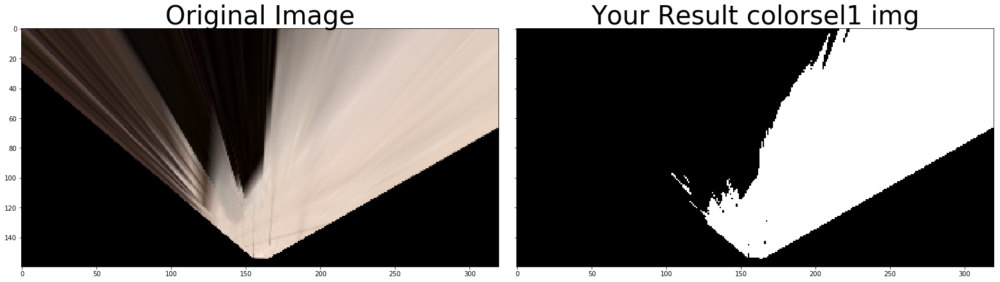

In [358]:
# Lets apply a color threshold to our figure

# Define a function to perform a color threshold
def color_thresh1(img, rgb_thresh=(160, 160, 160)):
    ###### TODO:
    # Create an empty array the same size in x and y as the image 
    # but just a single channel
    print("This is the image shape {}".format(img.shape))
    # Lets create a bidemensional array from the 3 dimensional image 
    # as we are storing 0s and 1s only( intead of an array of 3 values RGB)
    color_select1 = np.zeros_like(img[:,:,0])
    print("This is the shape and content of  color_select zeros bidimensional array created from imag:")
    print('/n')
    print(color_select1.shape) # This is a bidimensional array as it will store just 0 and 1
    print(color_select1)
    
    # Apply the thresholds for RGB and assign 1's 
    # where threshold was exceeded
    # Return the single-channel binary image
    
    # Require that each pixel be above all three threshold values in RGB
    # above_thresh will now contain a boolean array with "True"
    # where threshold was met
    above_thresh1 = (img[:,:,0] > rgb_thresh[0]) \
                & (img[:,:,1] > rgb_thresh[1]) \
                & (img[:,:,2] > rgb_thresh[2])
    # Index the array of zeros with the boolean array and set to 1            
    color_select1[above_thresh1] = 1
    # Return the binary image
    # Let see how is coor select before return it
    print('/n')
    print("This is color_select1 features just before returned:")
    print("A 160x320 bi-dimensional array of 0 and 1, meaning a 160x320 binary array ")
    print(color_select1.shape)
    print(color_select1)
    return(color_select1)
 

#img_perspectTransf = np.copy(warped)
img_perspectTransf = warped

# pixels below the thresholds
colorsel1 = color_thresh1(img_perspectTransf, rgb_thresh=(160,160,160))

# Display the original image and binary               
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(21, 7), sharey=True)
f.tight_layout()
ax1.imshow(img_perspectTransf)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(colorsel1, cmap='gray')
ax2.set_title('Your Result colorsel1 img', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
#plt.show() # Uncomment if running on your local machine

# Numpy .nonzero()
numpy.nonzero(a)[source]
Return the indices of the elements that are non-zero.

Returns a tuple of arrays, one for each dimension of a, containing the indices of the non-zero elements 
in that dimension. The values in a are always tested and returned in row-major, C-style order. 
The corresponding non-zero values can be obtained with:

```python
>>> x = np.array([[1,0,0], [0,2,0], [1,1,0]])
>>> x
array([[1, 0, 0],
       [0, 2, 0],
       [1, 1, 0]])
>>> np.nonzero(x)
(array([0, 1, 2, 2]), array([0, 1, 0, 1]))
The first array is row position and the second colum posiiton
So it means in  :
    row0,col0 we have anonzero value  
    row1,col1 we have anonzero value 
    row2,col0 we have anonzero value 
    row2,col1 we have anonzero value 
```

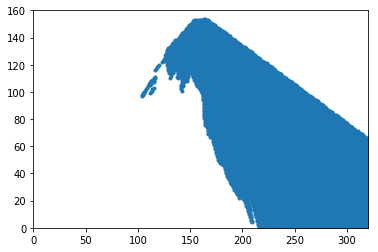

In [359]:
# Lest take all nonzero values of colorsel1(meanin all 1 values) and put them in two arrays
ypos, xpos = colorsel1.nonzero()
plt.plot(xpos, ypos, '.')
plt.xlim(0, 320)
plt.ylim(0, 160)
plt.show()

In [360]:
# Let use a method to make teh coordiantes relatives to world coordinates
def rover_coords1(binary_img):
    # Extract xpos and ypos pixel positions from binary_img and
    # Convert xpos and ypos to rover-centric coordinates
    x_pixel = [0]
    y_pixel = [0]
    return x_pixel, y_pixel

In [361]:
# Define a function to convert from image coords to rover coords
# Much better that before
def rover_coords1(binary_img):
    # Identify nonzero pixels
    ypos, xpos = binary_img.nonzero()
    # Calculate pixel positions with reference to the rover position being at the 
    # center bottom of the image.  
    x_pixel = -(ypos - binary_img.shape[0]).astype(np.float)
    y_pixel = -(xpos - binary_img.shape[1]/2 ).astype(np.float)
    return x_pixel, y_pixel

Text(0.5, 1.0, 'Rover-Centric Map')

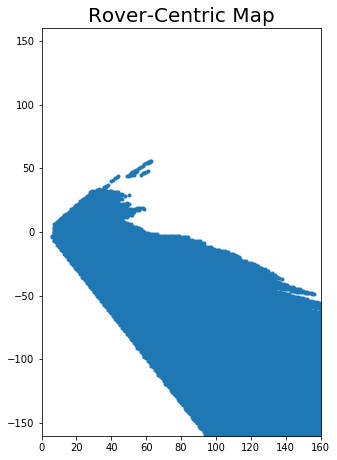

In [362]:
xpix, ypix = rover_coords1(colorsel1)

# # Plot the map in rover-centric coords
fig = plt.figure(figsize=(5, 7.5))
plt.plot(xpix, ypix, '.')
plt.ylim(-160, 160)
plt.xlim(0, 160)
plt.title('Rover-Centric Map', fontsize=20)

###  Mapping to world coordinates

IN lesson 9 we mapped this to world coordinates

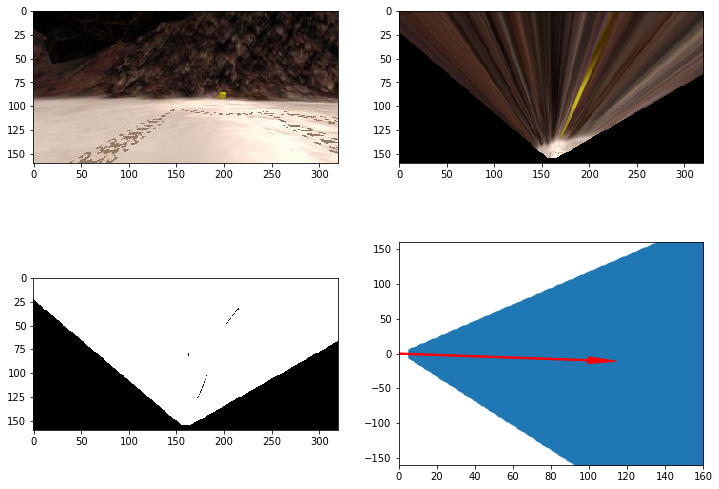

In [363]:
# Define a function to convert from image coords to rover coords
def rover_coords(binary_img):
    # Identify nonzero pixels
    ypos, xpos = binary_img.nonzero()
    # Calculate pixel positions with reference to the rover position being at the 
    # center bottom of the image.  
    x_pixel = -(ypos - binary_img.shape[0]).astype(np.float)
    y_pixel = -(xpos - binary_img.shape[1]/2 ).astype(np.float)
    return x_pixel, y_pixel

# Define a function to convert to radial coords in rover space
def to_polar_coords(x_pixel, y_pixel):
    # Convert (x_pixel, y_pixel) to (distance, angle) 
    # in polar coordinates in rover space
    # Calculate distance to each pixel
    dist = np.sqrt(x_pixel**2 + y_pixel**2)
    # Calculate angle away from vertical for each pixel
    angles = np.arctan2(y_pixel, x_pixel)
    return dist, angles

# Define a function to map rover space pixels to world space
def rotate_pix(xpix, ypix, yaw):
    # Convert yaw to radians 
    yaw_rad = yaw * np.pi / 180
    xpix_rotated = (xpix * np.cos(yaw_rad)) - (ypix * np.sin(yaw_rad))
                            
    ypix_rotated = (xpix * np.sin(yaw_rad)) + (ypix * np.cos(yaw_rad))
    # Return the result  
    return xpix_rotated, ypix_rotated

def translate_pix(xpix_rot, ypix_rot, xpos, ypos, scale): 
    # Apply a scaling and a translation
    xpix_translated = (xpix_rot / scale) + xpos
    ypix_translated = (ypix_rot / scale) + ypos
    # Return the result  
    return xpix_translated, ypix_translated


# Define a function to apply rotation and translation (and clipping)
# Once you define the two functions above this function should work
def pix_to_world(xpix, ypix, xpos, ypos, yaw, world_size, scale):
    # Apply rotation
    xpix_rot, ypix_rot = rotate_pix(xpix, ypix, yaw)
    # Apply translation
    xpix_tran, ypix_tran = translate_pix(xpix_rot, ypix_rot, xpos, ypos, scale)
    # Perform rotation, translation and clipping all at once
    x_pix_world = np.clip(np.int_(xpix_tran), 0, world_size - 1)
    y_pix_world = np.clip(np.int_(ypix_tran), 0, world_size - 1)
    # Return the result
    return x_pix_world, y_pix_world

#Lest try it
# Grab another random image
idx = np.random.randint(0, len(img_list)-1)
image = mpimg.imread(img_list[idx])
warped, mask = perspect_transform(image, source, destination)
threshed = color_thresh(warped)

# Calculate pixel values in rover-centric coords and distance/angle to all pixels
xpix, ypix = rover_coords(threshed)
dist, angles = to_polar_coords(xpix, ypix)
mean_dir = np.mean(angles)

# Do some plotting
fig = plt.figure(figsize=(12,9))
plt.subplot(221)
plt.imshow(image)
plt.subplot(222)
plt.imshow(warped)
plt.subplot(223)
plt.imshow(threshed, cmap='gray')
plt.subplot(224)
plt.plot(xpix, ypix, '.')
plt.ylim(-160, 160)
plt.xlim(0, 160)
arrow_length = 100
x_arrow = arrow_length * np.cos(mean_dir)
y_arrow = arrow_length * np.sin(mean_dir)
plt.arrow(0, 0, x_arrow, y_arrow, color='red', zorder=2, head_width=10, width=2)

### What direction to steer the rover . Lesson 10

The goal of this project is to perform autonomous navigation and mapping. You now have the mapping piece and realistically, that means the hard work is done! With each new image you receive from the rover's camera, you will have the opportunity to make a decision about sending commands like throttle, brake and steering. But how to decide what values to send for these commands?

Let's start with steering. There are many ways to approach this, but for starters I'll propose one simple method to decide on a steering angle that will get you up and running with the project. Here we'll consider this image where   **there is clearly more open ground to the rigth( or left like in the exercise) as seen from the rover's perspective** :

To do this you will first convert your (x, y) pixel positions to polar coordinates, where each pixel
position is represented by its distance from the origin and angle counterclockwise from the positive x-direction.



In [273]:
# See the project to see all function to convert from image coords to rover coords and eventually world coord

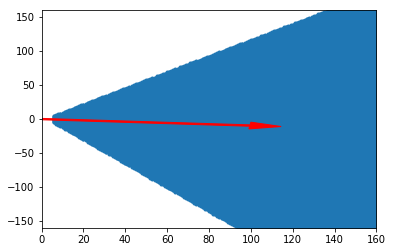

In [364]:
# Define a function to convert from cartesian to polar coordinates
def to_polar_coords(xpix, ypix):
    # Calculate distance to each pixel
    dist = np.sqrt(xpix**2 + ypix**2)
    # Calculate angle using arctangent function
    angles = np.arctan2(ypix, xpix)
    return dist, angles

#Now we  can process the above image and plot up the results.

# Distances and Angles to polar cooridnates
distances, angles = to_polar_coords(xpix, ypix) # Convert to polar coords
avg_angle = np.mean(angles) # Compute the average angl
# Plotting
plt.plot(xpix, ypix, '.')
plt.ylim(-160, 160)
plt.xlim(0, 160)
arrow_length = 100
x_arrow = arrow_length * np.cos(avg_angle)
y_arrow = arrow_length * np.sin(avg_angle)
plt.arrow(0, 0, x_arrow, y_arrow, color='red', zorder=2, head_width=10, width=2)
plt.show()

## Decision and Actions

lession from 11 to 16

### Reading data , creating variables and defining an Databucket
Importing pandas
Read the csv file as a dataframe. Store it in a variable called df
Read all images from the /IMG folder.Store those in a List called csv_img_list
We read the black and white image .Store it in a variable called ground_truth
We created a 3d image version of the map (set Red and blu channel to 0 and green to 1)
define a class called Databucket to store all values inside an instance of this class




## DATABUCKET OBJECT


Create a class to store the information generated by the roller
Data in the excel document as a panda file
Images in the IMG/ folder as a list using panda df to list
Load the binary black and white true map of the cave (provided to use as data)
3D representation of the above ground map 

In [332]:
# Understanding dstack
a = np.array((1,2,3))
print("a = {}".format(a))
b = np.array((2,3,4))
print("b = {}".format(b))
c=np.dstack((a,b))
print("c has  {} dimensions".format(c.ndim))
print("c shape is {}".format(c.shape))
print("c has 1 row , 3 column and in each row and colum we have 2 values")
print("c type is {}".format(type(c)))
print("c = {}".format(c))


a = [1 2 3]
b = [2 3 4]
c has  3 dimensions
c shape is (1, 3, 2)
c has 1 row , 3 column and in each row and colum we have 2 values
c type is <class 'numpy.ndarray'>
c = [[[1 2]
  [2 3]
  [3 4]]]


In [476]:
# Import pandas and read in csv file as a dataframe
import pandas as pd
# Change the path below to your data directory
# If you are in a locale (e.g., Europe) that uses ',' as the decimal separator
# change the '.' to ','
df = pd.read_csv('test_dataset/robot_log.csv', delimiter=';', decimal='.')
csv_img_list1 = df["Path"].tolist() # Create list of image pathnames

csv_img_list=list(map(lambda img : img[108:], csv_img_list1))
# Read in ground truth map and create a 3-channel image with it
ground_truth = mpimg.imread('calibration_images/map_bw.png')
# Lets create a three channel version of above 2D black and white map where Red Channel and Blue Channel =0
# So we will get a gren map
ground_truth_3d = np.dstack((ground_truth*0, ground_truth*255, ground_truth*0)).astype(np.float)

# # Testing all above variables
# print(type(csv_img_list1))
# print(csv_img_list1[0])
# print(len(csv_img_list1))

# print(type(csv_img_list))
# print(csv_img_list[0])

# # ground has a diferent sahpe than images in IMG/ that is 200x200
# print(ground_truth.shape)
# print(ground_truth_3d.shape)

# Creating a class to be the data container
# Will read in saved data from csv file and populate this object
# Worldmap is instantiated as 200 x 200 grids corresponding 
# to a 200m x 200m space (same size as the ground truth map: 200 x 200 pixels)
# This encompasses the full range of output position values in x and y from the sim
class Databucket():
    def __init__(self):
        self.images = csv_img_list  
        self.xpos = df["X_Position"].values
        self.ypos = df["Y_Position"].values
        self.yaw = df["Yaw"].values
        self.count = 0 # This will be a running index
        self.worldmap = np.zeros((200, 200, 3)).astype(np.float)
        self.ground_truth = ground_truth_3d # Ground truth worldmap

# Instantiate a Databucket().. this will be a global variable/object
# that you can refer to in the process_image() function below
data = Databucket()

### Write a function called process_image(img) to process each one of teh list of images

In [374]:
# Define a function to pass stored images to
# reading rover position and yaw angle from csv file
# This function will be used by moviepy to create an output video
def process_image(img):
    # Example of how to use the Databucket() object defined above
    # to print the current x, y and yaw values 
    # print(data.xpos[data.count], data.ypos[data.count], data.yaw[data.count])

    # TODO: 
    # 1) Define source and destination points for perspective transform
    # 2) Apply perspective transform
    # 3) Apply color threshold to identify navigable terrain/obstacles/rock samples
    # 4) Convert thresholded image pixel values to rover-centric coords
    # 5) Convert rover-centric pixel values to world coords
    # 6) Update worldmap (to be displayed on right side of screen)
        # Example: data.worldmap[obstacle_y_world, obstacle_x_world, 0] += 1
        #          data.worldmap[rock_y_world, rock_x_world, 1] += 1
        #          data.worldmap[navigable_y_world, navigable_x_world, 2] += 1
    
    # Perspective transform and mask
    
    # Apply color thereshold to identify navigable terrain/obstacles/rock samples
    # Get a navegation map and and optical map 

    # 7) Make a mosaic image, below is some example code
        # First create a blank image (can be whatever shape you like)
    output_image = np.zeros((img.shape[0] + data.worldmap.shape[0], img.shape[1]*2, 3))
        # Next you can populate regions of the image with various output
        # Here I'm putting the original image in the upper left hand corner
    output_image[0:img.shape[0], 0:img.shape[1]] = img

        # Let's create more images to add to the mosaic, first a warped image 
    warped, mask= perspect_transform(img, source, destination)
        # Add the warped image in the upper right hand corner
    output_image[0:img.shape[0], img.shape[1]:] = warped

        # Overlay worldmap with ground truth map
    map_add = cv2.addWeighted(data.worldmap, 1, data.ground_truth, 0.5, 0)
        # Flip map overlay so y-axis points upward and add to output_image 
    output_image[img.shape[0]:, 0:data.worldmap.shape[1]] = np.flipud(map_add)


        # Then putting some text over the image
    cv2.putText(output_image,"Populate this image with your analyses to make a video!", (20, 20), 
                cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 255, 255), 1)
    if data.count < len(data.images) - 1:
        data.count += 1 # Keep track of the index in the Databucket()
    
    return output_image

## MODIFIED VERSION READ SOLUTION 

In [407]:
# Define a function to pass stored images to
# reading rover position and yaw angle from csv file
# This function will be used by moviepy to create an output video
def process_image_Modified1(img):
    
    print("img passed to process_image")
    # Example of how to use the Databucket() object defined above
    # to print the current x, y and yaw values 
    # print(data.xpos[data.count], data.ypos[data.count], data.yaw[data.count])

    # TODO: 
    # 1) Define source and destination points for perspective transform
    # 2) Apply perspective transform
    # 3) Apply color threshold to identify navigable terrain/obstacles/rock samples
    # 4) Convert thresholded image pixel values to rover-centric coords
    # 5) Convert rover-centric pixel values to world coords
    # 6) Update worldmap (to be displayed on right side of screen)
        # Example: data.worldmap[obstacle_y_world, obstacle_x_world, 0] += 1
        #          data.worldmap[rock_y_world, rock_x_world, 1] += 1
        #          data.worldmap[navigable_y_world, navigable_x_world, 2] += 1
    
    # Perspective transform: We get for each image a warped and a mask
    # warped: Is a 3 color deep  RGB image transformation of how the robot is seeing this image .We get this by 
    # providing 4 points in an area of 1sq meter. We get a superiro view of how the robot is looking at the image 
    # the image will be split in 1sqm line
    # Mask: Is a 2 color deep , balck and white ,  color transformation of the warped image.So it is easier to 
    # define 
    warped, mask = perspect_transform(img, source, destination) 
    # Apply color thereshold to identify navigable terrain/obstacles/rock samples
    threshed = color_thresh(warped)
    # Get a navegation map and and optical map ( just turn what is not navegable to 1, menaing those are obstales)
    obs_map = np.absolute(np.float32(threshed) - 1) * mask
    xpix, ypix = rover_coords(threshed)
    
    # Convert rover-centric pixel values to world coords
    world_size = data.worldmap.shape[0]
    scale = 2* dst_size
    
    # Getting the x_pos , y_pos and yaw for this picture 
    xpos = data.xpos[data.count]
    ypos = data.ypos[data.count]
    yaw =  data.yaw[data.count]
    
    # Perspective transform and mask for each image
    warped, mask = perspect_transform(img, source, destination) 
    # Apply color thereshold to identify navigable terrain/obstacles/rock samples
    threshed = color_thresh(warped, rgb_thresh=(160, 160, 160))
    # Get a navegation map and and optical map ( just turn what is not navegable to 1, menaing those are obstales)
    obs_map = np.absolute(np.float32(threshed) - 1) * mask
    xpix, ypix = rover_coords(threshed)
    
    
    x_world, y_world = pix_to_world(xpix, ypix, xpos, ypos, yaw, world_size, scale)
    obsxpix, obsypix = rover_coords(obs_map)
    obs_x_world, obs_y_world = pix_to_world(obsxpix, obsypix, xpos, ypos, yaw, world_size, scale)
    # Update worldmap (to be displayed on right side of screen)
        # Example: data.worldmap[obstacle_y_world, obstacle_x_world, 0] += 1
        #          data.worldmap[rock_y_world, rock_x_world, 1] += 1
        #          data.worldmap[navigable_y_world, navigable_x_world, 2] += 1
    data.worldmap[y_world, x_world, 2] = 255  # Blue channel 255 updated to nav terrain
    data.worldmap[obs_y_world, obs_x_world, 0] = 255  # Red channel , updated to 255 to obstacles
    # We should look into the pixels to see more if they belong to the obstacle or nav terrain
    # Will have some overlapping.
    
    # If the Blue channel is >0 set the Red channel to 0
    # meaning that if by beofre anaylsis we found thsi to be navegable terrains , then we will
    # assume it is by saying obstacles =0 or no ostacle here
    nav_pix =data.worldmap[:, :, 2] >0                     
    data.worldmap[nav_pix, 0] = 0
    # See if we can find some rocks
    rock_map = find_rocks(warped, levels=(110,110,50))
    if rock_map.any():
        rock_x, rock_y = rover_coords(rock_map)
        rock_x_world, rock_y_world = pix_to_world(rock_x, rock_y, xpos, ypos, yaw, world_size, scale)
        data.worldmap[rock_y_world, rock_x_world, :] = 255
    
    

        
    # 7) Make a mosaic image,  below is some example code
        # First create a blank image (can be whatever shape you like)
    output_image = np.zeros((img.shape[0] + data.worldmap.shape[0], img.shape[1]*2, 3))
        # Next you can populate regions of the image with various output
        # Here I'm putting the original image in the upper left hand corner
    output_image[0:img.shape[0], 0:img.shape[1]] = img

        # Let's create more images to add to the mosaic, first a warped image 
    warped= perspect_transform(img, source, destination)
        # Add the warped image in the upper right hand corner
    output_image[0:img.shape[0], img.shape[1]:] = warped

        # Overlay worldmap with ground truth map
    map_add = cv2.addWeighted(data.worldmap, 1, data.ground_truth, 0.5, 0)
        # Flip map overlay so y-axis points upward and add to output_image 
    output_image[img.shape[0]:, 0:data.worldmap.shape[1]] = np.flipud(map_add)


        # Then putting some text over the image
    cv2.putText(output_image,"Populate this image with your analyses to make a video!", (20, 20), 
                cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 255, 255), 1)
    if data.count < len(data.images) - 1:
        data.count += 1 # Keep track of the index in the Databucket()
    
    return output_image

#### Verifying all images in the imagen list has teh same size


In [408]:
# Loading an displaying a random image
path1 = 'test_dataset/IMG/*'
img_list1 = glob.glob(path1)
print("We have  {} images in test_dataset/IMG/ folder ".format(len(img_list1)))
# Grab a random image and display it
counter=[]
for img in img_list1:
    image = mpimg.imread(img)
    height, width, channels =image.shape
    counter.append(False)  if (height != 160 or width != 320 or channels != 3 ) else counter.append(True)
print(counter.count(True))

We have  1558 images in test_dataset/IMG/ folder 
1558


In [376]:
ls -al

total 12144
drwxr-xr-x  15 david  staff      480 Dec 18 16:49 ./
drwxr-xr-x   5 david  staff      160 Dec 18 16:49 ../
-rw-r--r--@  1 david  staff     8196 Dec 16 13:59 .DS_Store
drwxr-xr-x   3 david  staff       96 Dec 18 16:46 .ipynb_checkpoints/
-rw-r--r--@  1 david  staff    97469 Dec 11 16:47 Robots Movement Descriptions.gif
-rw-r--r--   1 david  staff  3969805 Dec 18 16:49 Using Numpy with Images.ipynb
drwxr-xr-x  13 david  staff      416 Dec 16 13:03 calibration_images/
-rw-r--r--   1 david  staff     7163 Dec 18 16:44 original_1.jpg
-rw-r--r--   1 david  staff      947 Dec 18 16:44 outfile_colorsel.jpg
-rw-r--r--   1 david  staff      947 Dec 15 19:56 outfile_colorselIMAGEIO.jpg
drwxr-xr-x   2 david  staff       64 Dec 16 20:54 output/
-rw-r--r--@  1 david  staff     5853 Dec 11 17:45 robocam_2018_12_11_17_43_34_365.jpg
-rw-r--r--@  1 david  staff     7159 Dec 11 17:45 robocam_2018_12_11_17_44_32_808.jpg
drwxr-xr-x   5 david  staff      160 Dec 16 14:55 test_dataset/
-rw-r--r--

### Make a video from processed image data 
Using moviepy library to process images and create a video using ImageSequenceClip function

#### Understanding ImageSequenceClip method from MoviePy


#####  ImageSequenceClip functio description from the documentation 
https://zulko.github.io/moviepy/getting_started/videoclips.html
This is a clip made from a series of images, you call it with

clip = ImageSequenceClip(images_list, fps=25)

where images_list can be either a list of image names (that will be played) in that order, 
a folder name (at which case all the image files in the folder will be played in alphanumerical order), 
or a list of frames (Numpy arrays), obtained for instance from other clips.

When you provide a folder name or list of file names, you can choose load_images=True 
to specify that all images should be loaded into the RAM. This is only interesting if you have a 
small number of images that will be each used more than once (e.g. if the images form a looping animation).

####  Issues


We faced some issues below when passing data.images value to ImageSequenceClip 
data.images is a list formed form the Path column in our excel file.It is an string

Originally it was 1558 values like this one 

/Users/david/Documents/Udacity NanoDegrees /Robotic Software Eng/RoverSimIntroduction/Roversim-Introduction/test_dataset/IMG/robocam_2018_12_16_14_13_44_763.jpg

Looks looks like the ImageSequeceClip function was not accepting this values 

We wanted to reduce it to 
test_dataset/IMG/robocam_2018_12_16_14_13_44_763.jpg

So we did this to the Databucket() that is where data.images is initialized

```python
csv_img_list1 = df["Path"].tolist() # Create list of image pathnames

csv_img_list=list(map(lambda img : img[108:], csv_img_list1))
````

Now csv_img_list contains 1558 elements like this one and data.images=csv_img_list

'test_dataset/IMG/robocam_2018_12_16_14_13_44_763.jpg'

But this never worked either so I had to pass a directory to the ImageSequenceClip

##### Passing a directory

clip = ImageSequenceClip('test_dataset/IMG/', fps=60)

And it worked perfectly

In [377]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from moviepy.editor import ImageSequenceClip


# Define pathname to save the output video
output = 'test_mapping.mp4'
data = Databucket() # Re-initialize data in case you're running this cell multiple times
clip = ImageSequenceClip('test_dataset/IMG/', fps=60)
#clip = ImageSequenceClip(data.images, fps=60) # Note: output video will be sped up because 
#                                           # recording rate in simulator is fps=25
new_clip = clip.fl_image(process_image) #NOTE: this function expects color images!!
#new_clip = clip.fl_image(process_imageModified1) #NOTE: this function expects color images!!
%time new_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video test_mapping.mp4
[MoviePy] Writing video test_mapping.mp4


100%|██████████| 1558/1558 [00:08<00:00, 192.04it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_mapping.mp4 

CPU times: user 6.85 s, sys: 1.03 s, total: 7.88 s
Wall time: 8.22 s


### Playing the video


In [378]:

from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

In [379]:
#Another way of doing it 
import io
import base64
video = io.open(output, 'r+b').read()
encoded_video = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded_video.decode('ascii')))

In [ ]:
## SOLUTIONS AND CHANGES

#### CHANGE 1-Adding chnages to the  perspective_transform(img,src,dst) function 
Objective : to show the visual field of the camera
We apply a perspective_transformation( read above about perspective_transformation function) by applying these two functions:

1-Find a transformation matrix(M):
  Then transformation matrix can be found by the function 
  cv2.getPerspectiveTransform. 
2-Then apply cv2.warpPerspective.




We will add this line to the function 
    perspective_transform(img,src,dst): 


```python
mask = cv2.warpPerspective(np.ones_like(img[:, :, 0]), M, (img.shape[1], (img.shape[0])))
````


So the whole function will be now

```python
def perspect_transform(img, src, dst):
    # Get transform matrix using cv2.getPerspectivTransform()
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp image using cv2.warpPerspective()
    # keep same size as input image
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))
    # Run ths same transformation on an array of 1s same size of the images and just one color channel
    mask = cv2.warpPerspective(np.ones_like(img[:, :, 0]), M, (img.shape[1], (img.shape[0])))
    # Return the result
    return warped, mask
```



Later we will call the function like this 

```pyhton

dst_size = 5
bottom_offset = 6

# Enter the points to the np.float32 as ( bottom-left,bottom-right, up-right, up-left)
# SO it is starting in the bootom-left and moving counter clock-wise
source = np.float32([[7.78,147.48], [311.731,144.615], [199.90,99.692] , [117.705,96.692] ])
#source = np.float32([ [7,147], [311,144], [199,99], [117,96],  ])

destination = np.float32([[image.shape[1]/2 - dst_size, image.shape[0] - bottom_offset],
                  [image.shape[1]/2 + dst_size, image.shape[0] - bottom_offset],
                  [image.shape[1]/2 + dst_size, image.shape[0] - 2*dst_size - bottom_offset], 
                  [image.shape[1]/2 - dst_size, image.shape[0] - 2*dst_size - bottom_offset],
                  ])

warped, mask = perspect_transform(image, source, destination)
fig = plt.figure(figsize=(12,6))
plt.subplot(121)
plt.imshow(warped)
plt.subplot(122)
plt.imshow(mask, cmap='gray')

```

#### CHANGE 2-Adding a function to identify rocks def find_rocks()
Creating a function to identify rocks and returns a bi dimenaionsl imge containing the pixels were the rock is

```python
# Creating a function to identify golden rocks
# we need to select the colors for yellow from https://www.rapidtables.com/web/color/RGB_Color.html or similar
# Note that if we try 200, 200, 20 the spot is tiny. Try with 150,150, 20 and the image will be bigger
def find_rocks(img, levels = (150, 150, 50)):
    # compare each element of the thrid axis (0,1,2) withe the leve and return a boolean value(ture or False)
    # whenever teh comparation holds True.rockpixels is a boolean array
    # The threshold for RGB are 
    rockpixels=((img[:, :, 0] > levels[0]) \
               & (img[:, :, 1] > levels[1]) \
               & (img[:, :, 2] < levels[2])
               )
    # Create a numpy array of two dimension (by setting the third axis to 0 we get a bi-dimensional array )
    # Similar to the img array
    color_select = np.zeros_like(img[:, :, 0])
    # Set the true value of the rockpixels to 1 and store them in color_select
    color_select[rockpixels] = 1
    return color_select

rock_img= output2
rock_map = find_rocks(rock_img)
fig = plt.figure(figsize=(12,3))
plt.subplot(121)
plt.imshow(rock_img)
plt.subplot(122)
plt.imshow(rock_map, cmap='gray')
```    


#### Process Image function 

This is the function that is called recursively for each iamge in our directory

We will transfor it so it could better serve our puroposes. This is what we had originally 
Now we have being able to do a lot of things with each images indivicually 
We have been creating methods that we can use now in this function



#### Define a function to pass stored images to
```python
# reading rover position and yaw angle from csv file
#This function will be used by moviepy to create an output video
def process_image(img):
    # Example of how to use the Databucket() object defined above
    # to print the current x, y and yaw values 
    # print(data.xpos[data.count], data.ypos[data.count], data.yaw[data.count])

    # TODO: 
    # 1) Define source and destination points for perspective transform
    # 2) Apply perspective transform
    # 3) Apply color threshold to identify navigable terrain/obstacles/rock samples
    # 4) Convert thresholded image pixel values to rover-centric coords
    # 5) Convert rover-centric pixel values to world coords
    # 6) Update worldmap (to be displayed on right side of screen)
        # Example: data.worldmap[obstacle_y_world, obstacle_x_world, 0] += 1
        #          data.worldmap[rock_y_world, rock_x_world, 1] += 1
        #          data.worldmap[navigable_y_world, navigable_x_world, 2] += 1
    
    # Perspective transform and mask
    
    # Apply color thereshold to identify navigable terrain/obstacles/rock samples
    # Get a navegation map and and optical map 

    # 7) Make a mosaic image, below is some example code
        # First create a blank image (can be whatever shape you like)
    output_image = np.zeros((img.shape[0] + data.worldmap.shape[0], img.shape[1]*2, 3))
        # Next you can populate regions of the image with various output
        # Here I'm putting the original image in the upper left hand corner
    output_image[0:img.shape[0], 0:img.shape[1]] = img

        # Let's create more images to add to the mosaic, first a warped image 
    warped= perspect_transform(img, source, destination)
        # Add the warped image in the upper right hand corner
    output_image[0:img.shape[0], img.shape[1]:] = warped

        # Overlay worldmap with ground truth map
    map_add = cv2.addWeighted(data.worldmap, 1, data.ground_truth, 0.5, 0)
        # Flip map overlay so y-axis points upward and add to output_image 
    output_image[img.shape[0]:, 0:data.worldmap.shape[1]] = np.flipud(map_add)


        # Then putting some text over the image
    cv2.putText(output_image,"Populate this image with your analyses to make a video!", (20, 20), 
                cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 255, 255), 1)
    if data.count < len(data.images) - 1:
        data.count += 1 # Keep track of the index in the Databucket()
    
    return output_image
```

Lets use them



In [488]:
# Define a function to pass stored images to
# reading rover position and yaw angle from csv file
# This function will be used by moviepy to create an output video
def process_image_Modified(img):
    # Example of how to use the Databucket() object defined above
    # to print the current x, y and yaw values 
    # print(data.xpos[data.count], data.ypos[data.count], data.yaw[data.count])

    # TODO: 
    # 1) Define source and destination points for perspective transform
    # 2) Apply perspective transform
    # 3) Apply color threshold to identify navigable terrain/obstacles/rock samples
    # 4) Convert thresholded image pixel values to rover-centric coords
    # 5) Convert rover-centric pixel values to world coords
    # 6) Update worldmap (to be displayed on right side of screen)
        # Example: data.worldmap[obstacle_y_world, obstacle_x_world, 0] += 1
        #          data.worldmap[rock_y_world, rock_x_world, 1] += 1
        #          data.worldmap[navigable_y_world, navigable_x_world, 2] += 1
    
    # Perspective transform: We get for each image a warped and a mask
    # warped: Is a 3 color deep  RGB image transformation of how the robot is seeing this image .We get this by 
    # providing 4 points in an area of 1sq meter. We get a superiro view of how the robot is looking at the image 
    # the image will be split in 1sqm line
    # Mask: Is a 2 color deep , balck and white ,  color transformation of the warped image.So it is easier to 
    # define 
    warped, mask = perspect_transform(img, source, destination) 
    # Apply color thereshold to identify navigable terrain/obstacles/rock samples
    threshed = color_thresh(warped, rgb_thresh=(160, 160, 160))
    # Get a map of obstacle pixels.Whenever the threshed map was 0, we'll  get 1.
    # We reduce 1 to each element in the binary element and multiply by mask
    obs_map = np.absolute(np.float32(threshed) - 1) * mask
    # Convert above map to rover coords
    # xpix and ypix are matix of x,y values for the images
    xpix, ypix = rover_coords(threshed)
    # Convert rover-centric pixel values to world coords.How big the square was in the 
    # perspective transform image
    world_size = data.worldmap.shape[0]
    scale = 2* dst_size
    
    # Getting the x, y and yaw value for each image
    xpos = data.xpos[data.count]
    ypos = data.ypos[data.count]
    yaw =  data.yaw[data.count]
    x_world, y_world = pix_to_world(xpix, ypix, xpos, ypos, yaw, world_size, scale)
    obsxpix, obsypix = rover_coords(obs_map)
    obs_x_world, obs_y_world = pix_to_world(obsxpix, obsypix, xpos, ypos, yaw, world_size, scale)
    # Update worldmap (to be displayed on right side of screen)
        # Example: data.worldmap[obstacle_y_world, obstacle_x_world, 0] += 1
        #          data.worldmap[rock_y_world, rock_x_world, 1] += 1
        #          data.worldmap[navigable_y_world, navigable_x_world, 2] += 1
    data.worldmap[y_world, x_world, 2] = 255  # Blue channel 255 updated to nav terrain
    data.worldmap[obs_y_world, obs_x_world, 0] = 255  # Red channel , updated to 255 to obstacles
    # We should look into the pixels to see more if they belong to the obstacle or nav terrain
    # Will have some overlapping.
    
    # If the Blue channel is >0 set the Red channel to 0
    # meaning that if by beofre anaylsis we found thsi to be navegable terrains , then we will
    # assume it is by saying obstacles =0 or no ostacle here
    nav_pix =data.worldmap[:, :, 2] >0                     
    data.worldmap[nav_pix, 0] = 0
    # See if we can find some rocks
    rock_map = find_rocks(warped, levels=(110,110,50))
    if rock_map.any():
        rock_x, rock_y = rover_coords(rock_map)
        rock_x_world, rock_y_world = pix_to_world(rock_x, rock_y, xpos, ypos, yaw, world_size, scale)
        data.worldmap[rock_y_world, rock_x_world, :] = 255

        
    # 7) Make a mosaic image,  below is some example code
        # First create a blank image (can be whatever shape you like)
    output_image = np.zeros((img.shape[0] + data.worldmap.shape[0], img.shape[1]*2, 3))
        # Next you can populate regions of the image with various output
        # Here I'm putting the original image in the upper left hand corner
    output_image[0:img.shape[0], 0:img.shape[1]] = img

        # Let's create more images to add to the mosaic, first a warped image 
    warped, mask= perspect_transform(img, source, destination)
        # Add the warped image in the upper right hand corner
    output_image[0:img.shape[0], img.shape[1]:] = warped

        # Overlay worldmap with ground truth map
    map_add = cv2.addWeighted(data.worldmap, 1, data.ground_truth, 0.5, 0)
        # Flip map overlay so y-axis points upward and add to output_image 
    output_image[img.shape[0]:, 0:data.worldmap.shape[1]] = np.flipud(map_add)


        # Then putting some text over the image
    cv2.putText(output_image,"Populate this image with your analyses to make a video!", (20, 20), 
                cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 255, 255), 1)
    if data.count < len(data.images) - 1:
        data.count += 1 # Keep track of the index in the Databucket()
    
    return output_image

#### Lets  create a video now with the new function

In [489]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from moviepy.editor import ImageSequenceClip


# Define pathname to save the output video
output = 'test_mapping1.mp4'
data = Databucket() # Re-initialize data in case you're running this cell multiple times
clip = ImageSequenceClip('test_dataset/IMG/', fps=60)
#clip = ImageSequenceClip(data.images, fps=60) # Note: output video will be sped up because 
#                                           # recording rate in simulator is fps=25
new_clip = clip.fl_image(process_image_Modified) #NOTE: this function expects color images!!
%time new_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video test_mapping1.mp4
[MoviePy] Writing video test_mapping1.mp4




















  0%|          | 0/3726 [00:00<?, ?it/s]

















  0%|          | 6/3726 [00:00<01:05, 56.65it/s]

















  0%|          | 17/3726 [00:00<00:56, 65.73it/s]

















  1%|          | 28/3726 [00:00<00:49, 74.34it/s]

















  1%|          | 39/3726 [00:00<00:45, 81.23it/s]

















  1%|▏         | 49/3726 [00:00<00:42, 85.88it/s]

















  2%|▏         | 58/3726 [00:00<00:42, 86.94it/s]

















  2%|▏         | 68/3726 [00:00<00:41, 88.38it/s]

















  2%|▏         | 78/3726 [00:00<00:40, 90.36it/s]

















  2%|▏         | 88/3726 [00:00<00:39, 91.80it/s]

















  3%|▎         | 98/3726 [00:01<00:41, 88.44it/s]

















  3%|▎         | 107/3726 [00:01<00:43, 83.12it/s]

















  3%|▎         | 116/3726 [00:01<00:43, 82.81it/s]

















  3%|▎         | 126/3726 [00:01<00:42, 85.66it/s]

















  4%|▎         | 136/3726 [00:01<00:40, 89.49it/s]


 18%|█▊        | 688/3726 [00:07<00:31, 96.45it/s]

















 19%|█▊        | 698/3726 [00:07<00:31, 97.22it/s]

















 19%|█▉        | 709/3726 [00:07<00:30, 98.99it/s]

















 19%|█▉        | 720/3726 [00:07<00:29, 100.93it/s]

















 20%|█▉        | 731/3726 [00:07<00:29, 101.71it/s]

















 20%|█▉        | 742/3726 [00:07<00:29, 102.80it/s]

















 20%|██        | 753/3726 [00:07<00:30, 96.98it/s] 

















 21%|██        | 764/3726 [00:07<00:30, 98.10it/s]

















 21%|██        | 775/3726 [00:08<00:29, 98.94it/s]

















 21%|██        | 785/3726 [00:08<00:30, 96.88it/s]

















 21%|██▏       | 795/3726 [00:08<00:30, 96.27it/s]

















 22%|██▏       | 805/3726 [00:08<00:30, 95.68it/s]

















 22%|██▏       | 815/3726 [00:08<00:30, 95.72it/s]

















 22%|██▏       | 826/3726 [00:08<00:29, 96.83it/s]

















 22%|██▏       | 836/3726 [00:08<00:29, 96.4

 36%|███▌      | 1331/3726 [00:14<00:25, 93.83it/s]

















 36%|███▌      | 1342/3726 [00:14<00:24, 95.89it/s]

















 36%|███▋      | 1352/3726 [00:14<00:25, 91.52it/s]

















 37%|███▋      | 1362/3726 [00:14<00:25, 92.99it/s]

















 37%|███▋      | 1372/3726 [00:14<00:25, 93.95it/s]

















 37%|███▋      | 1382/3726 [00:14<00:25, 92.81it/s]

















 37%|███▋      | 1392/3726 [00:14<00:25, 91.28it/s]

















 38%|███▊      | 1402/3726 [00:15<00:26, 89.19it/s]

















 38%|███▊      | 1412/3726 [00:15<00:25, 89.73it/s]

















 38%|███▊      | 1421/3726 [00:15<00:26, 88.24it/s]

















 38%|███▊      | 1430/3726 [00:15<00:27, 84.60it/s]

















 39%|███▊      | 1439/3726 [00:15<00:28, 81.35it/s]

















 39%|███▉      | 1448/3726 [00:15<00:28, 79.31it/s]

















 39%|███▉      | 1457/3726 [00:15<00:28, 79.75it/s]

















 39%|███▉      | 1466/3726 [00:15<

 53%|█████▎    | 1965/3726 [00:21<00:20, 85.32it/s]

















 53%|█████▎    | 1975/3726 [00:21<00:20, 86.63it/s]

















 53%|█████▎    | 1984/3726 [00:21<00:19, 87.36it/s]

















 54%|█████▎    | 1994/3726 [00:21<00:19, 88.02it/s]

















 54%|█████▍    | 2003/3726 [00:21<00:19, 87.85it/s]

















 54%|█████▍    | 2012/3726 [00:22<00:19, 87.93it/s]

















 54%|█████▍    | 2021/3726 [00:22<00:19, 86.57it/s]

















 54%|█████▍    | 2030/3726 [00:22<00:19, 87.44it/s]

















 55%|█████▍    | 2041/3726 [00:22<00:18, 90.97it/s]

















 55%|█████▌    | 2051/3726 [00:22<00:18, 90.72it/s]

















 55%|█████▌    | 2061/3726 [00:22<00:18, 90.26it/s]

















 56%|█████▌    | 2071/3726 [00:22<00:18, 87.86it/s]

















 56%|█████▌    | 2081/3726 [00:22<00:18, 89.54it/s]

















 56%|█████▌    | 2090/3726 [00:22<00:18, 89.53it/s]

















 56%|█████▋    | 2099/3726 [00:23<

 69%|██████▉   | 2575/3726 [00:28<00:11, 98.05it/s]

















 69%|██████▉   | 2585/3726 [00:28<00:11, 97.70it/s]

















 70%|██████▉   | 2595/3726 [00:28<00:11, 97.94it/s]

















 70%|██████▉   | 2606/3726 [00:28<00:11, 99.35it/s]

















 70%|███████   | 2616/3726 [00:29<00:11, 98.52it/s]

















 70%|███████   | 2626/3726 [00:29<00:11, 98.48it/s]

















 71%|███████   | 2636/3726 [00:29<00:11, 98.39it/s]

















 71%|███████   | 2646/3726 [00:29<00:11, 97.44it/s]

















 71%|███████▏  | 2656/3726 [00:29<00:11, 96.38it/s]

















 72%|███████▏  | 2667/3726 [00:29<00:10, 98.24it/s]

















 72%|███████▏  | 2677/3726 [00:29<00:10, 96.89it/s]

















 72%|███████▏  | 2688/3726 [00:29<00:10, 97.70it/s]

















 72%|███████▏  | 2698/3726 [00:29<00:10, 95.38it/s]

















 73%|███████▎  | 2708/3726 [00:30<00:10, 94.77it/s]

















 73%|███████▎  | 2718/3726 [00:30<

 87%|████████▋ | 3249/3726 [00:35<00:04, 98.95it/s]

















 87%|████████▋ | 3259/3726 [00:35<00:04, 98.49it/s]

















 88%|████████▊ | 3270/3726 [00:35<00:04, 99.77it/s]

















 88%|████████▊ | 3280/3726 [00:36<00:04, 99.31it/s]

















 88%|████████▊ | 3291/3726 [00:36<00:04, 99.38it/s]

















 89%|████████▊ | 3301/3726 [00:36<00:04, 96.00it/s]

















 89%|████████▉ | 3311/3726 [00:36<00:04, 96.71it/s]

















 89%|████████▉ | 3321/3726 [00:36<00:04, 96.44it/s]

















 89%|████████▉ | 3331/3726 [00:36<00:04, 93.80it/s]

















 90%|████████▉ | 3341/3726 [00:36<00:04, 93.26it/s]

















 90%|████████▉ | 3351/3726 [00:36<00:03, 95.11it/s]

















 90%|█████████ | 3361/3726 [00:36<00:03, 96.41it/s]

















 90%|█████████ | 3371/3726 [00:36<00:03, 95.97it/s]

















 91%|█████████ | 3382/3726 [00:37<00:03, 97.45it/s]

















 91%|█████████ | 3393/3726 [00:37<

[MoviePy] Done.
[MoviePy] >>>> Video ready: test_mapping1.mp4 

CPU times: user 37.4 s, sys: 2.53 s, total: 40 s
Wall time: 40.7 s


In [490]:
### Playing tthe video  

In [491]:

from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

In [492]:
#Another way of doing it 
import io
import base64
video = io.open(output, 'r+b').read()
encoded_video = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded_video.decode('ascii')))

### Preparing the app 

#### Download the project form Git and virtual Env
Create a virtual Enviorement, Activate , list package to requirements 

```python
$ conda create --name RoboND-Rover-ENV jupyter numpy opencv matplotlib pillow  flask python-socketio scipy imageio /
                         / requests

#from conda-forge we will need the following packages 
conda install -c conda-forge eventlet
conda install -c conda-forge moviepy

conda activate 
conda list > requirements.txt
```

Note that I'm here going thoruha paralel anaylsys of the Nnaodegree some packages could not be used here 
for example flask python-socketio scipy imageio are not needed to run this Jupyter notebook , but could be needed to
run the Jupyter notebook and exercises in the project

We see that we used exactly ths ame packages I used for my exercises

$ conda create --name numpyImages jupyter numpy opencv matplotlib pillow flask  pillow python-socketio scipy pandas /
                       / moviepy
conda install -c conda-forge eventlet


Git Hub

(RoboND-Rover-ENV) (refactoringV3) david (master) RoboND-Rover-Project
$ git remote -v

origin  https://github.com/udacity/RoboND-Rover-Project.git (fetch)
origin  https://github.com/udacity/RoboND-Rover-Project.git (push)
(RoboND-Rover-ENV) (refactoringV3) david (master) RoboND-Rover-Project

#### Change to your own Git Hub remote repo

$ git remote set-url  origin https://github.com/david68cu/RoboND-Rover-Project.git
(RoboND-Rover-ENV) (refactoringV3) david (master) RoboND-Rover-Project

###  Check all is ok

$ git remote -v
origin  https://github.com/david68cu/RoboND-Rover-Project.git (fetch)
origin  https://github.com/david68cu/RoboND-Rover-Project.git (push)
(RoboND-Rover-ENV) (refactoringV3) david (master) RoboND-Rover-Project


#### Socket IO
The app uses socketIO a module called python-socketio
https://python-socketio.readthedocs.io/en/latest/
That allows a webapp to use WebSockets:
WebSocket connection is a permanent, bi-directional communication channel between a client and the server, where either one can initiate an exchange. Once established, the connection remains available until one of the parties disconnects from it.

 WebSocket connections are useful for games or web sites that need to display live information with very low latency. Before this protocol existed there were other much less efficient approaches to achieve the same result such as Comet.
Read here about it https://blog.miguelgrinberg.com/post/easy-websockets-with-flask-and-gevent/page/12


#### Starting the app
Once we have all that in place and we start the app by running

python 

We will have  port open and in a listening state at tcp:4567

If we look inside 

lsoft -nP -iTCP
python3.7 29372 david    4u  IPv4 0x4e6658e1a3b03171      0t0  TCP *:4567 (LISTEN)

If you look into your Python code editor you will see a lot of request and response from your Roversim to your python server on port 4567


lsoft -nP -iTCP

python3.7 29372 david    6u  IPv4 0x4e6658e1a63fc471      0t0  TCP 127.0.0.1:4567->127.0.0.1:61851 (ESTABLISHED)
python3.7 29372 david    7u  IPv4 0x4e6658e1a63fb171      0t0  TCP 127.0.0.1:4567->127.0.0.1:61852 (ESTABLISHED)
python3.7 29372 david    8u  IPv4 0x4e6658e1a640ce71      0t0  TCP 127.0.0.1:4567->127.0.0.1:61853 (ESTABLISHED)
python3.7 29372 david    9u  IPv4 0x4e6658e1a640d7f1      0t0  TCP 127.0.0.1:4567->127.0.0.1:61854 (ESTABLISHED)
python3.7 29372 david   10u  IPv4 0x4e6658e1a6407471      0t0  TCP 127.0.0.1:4567->127.0.0.1:61855 (ESTABLISHED)
python3.7 29372 david   11u  IPv4 0x4e6658e1a63c5af1      0t0  TCP 127.0.0.1:4567->127.0.0.1:61856 (ESTABLISHED)
python3.7 29372 david   12u  IPv4 0x4e6658e1a63c6471      0t0  TCP 127.0.0.1:4567->127.0.0.1:61857 (ESTABLISHED)
python3.7 29372 david   13u  IPv4 0x4e6658e1a647de71      0t0  TCP 127.0.0.1:4567->127.0.0.1:61858 (ESTABLISHED)
python3.7 29372 david   14u  IPv4 0x4e6658e1a647faf1      0t0  TCP 127.0.0.1:4567->127.0.0.1:61859 (ESTABLISHED)
python3.7 29372 david   15u  IPv4 0x4e6658e1a6459471      0t0  TCP 127.0.0.1:4567->127.0.0.1:61860 (ESTABLISHED)
python3.7 29372 david   16u  IPv4 0x4e6658e1a6458af1      0t0  TCP 127.0.0.1:4567->127.0.0.1:61861 (ESTABLISHED)
python3.7 29372 david   17u  IPv4 0x4e6658e1a646e171      0t0  TCP 127.0.0.1:4567->127.0.0.1:61862 (ESTABLISHED)
python3.7 29372 david   18u  IPv4 0x4e6658e1a646f471      0t0  TCP 127.0.0.1:4567->127.0.0.1:61863 (ESTABLISHED)
python3.7 29372 david   32u  IPv4 0x4e6658e1a63d3471      0t0  TCP 127.0.0.1:4567->127.0.0.1:61849 (ESTABLISHED)
python3.7 29372 david   34u  IPv4 0x4e6658e1a63d0e71      0t0  TCP 127.0.0.1:4567->127.0.0.1:61850 (ESTABLISHED)
Roversim  29436 david   24u  IPv4 0x4e6658e1a63fa7f1      0t0  TCP 127.0.0.1:61851->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   25u  IPv4 0x4e6658e1a63f9e71      0t0  TCP 127.0.0.1:61852->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   26u  IPv4 0x4e6658e1a640e171      0t0  TCP 127.0.0.1:61853->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   27u  IPv4 0x4e6658e1a640f471      0t0  TCP 127.0.0.1:61854->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   28u  IPv4 0x4e6658e1a6406af1      0t0  TCP 127.0.0.1:61855->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   29u  IPv4 0x4e6658e1a64057f1      0t0  TCP 127.0.0.1:61856->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   30u  IPv4 0x4e6658e1a63c3e71      0t0  TCP 127.0.0.1:61857->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   31u  IPv4 0x4e6658e1a63c47f1      0t0  TCP 127.0.0.1:61858->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   32u  IPv4 0x4e6658e1a647e7f1      0t0  TCP 127.0.0.1:61859->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   33u  IPv4 0x4e6658e1a6480471      0t0  TCP 127.0.0.1:61860->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   34u  IPv4 0x4e6658e1a6456e71      0t0  TCP 127.0.0.1:61861->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   35u  IPv4 0x4e6658e1a64577f1      0t0  TCP 127.0.0.1:61862->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   36u  IPv4 0x4e6658e1a646eaf1      0t0  TCP 127.0.0.1:61863->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   48u  IPv4 0x4e6658e1a63d2af1      0t0  TCP 127.0.0.1:61849->127.0.0.1:4567 (ESTABLISHED)
Roversim  29436 david   49u  IPv4 0x4e6658e1a63d2171      0t0  TCP 127.0.0.1:61850->127.0.0.1:4567 (ESTABLISHED)
    
